# Objective of Analysis
- In highly competitive telecom industry, customers can choose and switch between multiple operators.
- It costs 5 to 10 times more to acquire a new customer than to retain an existing customer.
- Hence, handling the churn rate or customer retention has become one of the primary business goals for all telecom companies in the industry.
- Objective of this study is to identify the prepaid customers at high risk of churn and take corrective actions to retain the customer.
- For this, we are going to build 2 models - one of them will be used to identify the prepaid customers at high risk of churn and the other is to identify the indicators of churn for a prepaid customer.
- An underlying assumption is that the customer doesn't switch to another competitor instantly. Instead, there will be a deviation from the regular usage pattern.
- Hence, out of the 4 months, the first two months - June and July are considered as _good_ months where customer's service usage is normal. Next month, August, is where the customer experience starts to sore and taking corrective measures during this phase may retain the customer from churning and this is called _action_ phase. Last month, September, is where the customer have churned and hence, it is called _churn_ phase.

# Understanding and Preparing Data
- A dataset that contains the prepaid customer's call and data usage details for 4 months - June, July, August and September.
- There are a total of 226 columns
- Drop columns that have only 1 unique value
- Treat missing values - either by imputing them or by removing the missing rows
- Derive high value customers and tag 1 for churn and 0 for not churn
- We can __derive__ columns like 
    - _average_ of the existing good phase months
    - _comparison columns_ for good vs action to identify usage patterns
    - _week of recharge_ and data from date of last recharge columns
- After identifying the high value customers and tagging churners, we ended up with very less percentage of churners when compared to non-churners. Handling __class imbalance__ using appropriate methods like SMOTE is necessary.
- Exploratory Data Analysis:
    - _Churn_ column is the output/dependent feature
    - Perform __Univariate Analysis__ on all numerical columns using _box, violin and dist_ plots
    - Plot _bins_ for columns to identify the distribution of the data
    - __Treat Outliers__ using quantile strategy. Ensure that enough amout of data is avaialble for analysis

# Model Building Strategy
- Build two models - one for predicting customer churn and the other to identify the features that are strong predictors of churn
- Normalize the data and divide dataset into train and test sets
- For the churn prediction model, 
    - Use PCA to reduce the dimentionality (no. of features)
    - Ensure that the correlation between selected PCAs are lower - which inturn means lower multi-collinearity
    - Build multiple models using above PCA components like Logistic Regression, SVM and Random Forests
    - __Tune hyperparameters__ before running above models on the PCAs
    - Use __Area Under Curve (AUC)__ score and __Recall__ score as parameters to evaluate the models
- For the model to identify strong features that leads to customer churn,
    - Use Decision Tree classifier model
    - __Tune hyperparameters__ with 'roc_auc' as scoring parameter

In [1]:
# Import required libraries

import pandas as pd
import numpy as np
import datetime as datetime
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import Lasso
from sklearn import svm
from sklearn import metrics
from imblearn.over_sampling import SMOTE
# import random

# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# For Model Building
import statsmodels.api as sm

# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Split data into train and test
from sklearn.model_selection import train_test_split

#Importing the PCA module
from sklearn.decomposition import PCA

#Using incremental PCA for efficiency - saves a lot of time on larger datasets
from sklearn.decomposition import IncrementalPCA

#Training the model on the train data
from sklearn.linear_model import LogisticRegression

# evaluation metrics
from sklearn.metrics import classification_report, confusion_matrix

# hide warnings
import warnings
warnings.filterwarnings('ignore')

## Functions - Data Manipulation

### Outlier Treatment using quantile

In [2]:
def outlier_treatment_with_quantile(df, cols, quantile):
    for col in cols:
        q = df[col].quantile(quantile)
        df = df.loc[df[col] < q]
    return df

### Get week of month

In [3]:
# 1 - first week, 2 - second week, 3 - third week, 4 - fourth week, 5 - fifth week
def get_week_of_month_from_date(date):
    if(date != 0):
        day = int(str(date).split('/')[1])
        if 1 <= day <= 7:
            return 1
        elif 8 <= day <= 14:
            return 2
        elif 15 <= day <= 21:
            return 3
        elif 22 <= day <= 28:
            return 4
        else:
            return 5
    else:
        return 0

### Get all column prefixes

In [4]:
def get_all_cols_prefixes(df):
    all_cols = []
    for col in df.columns:
        if (col != 'aon' and col != 'jun_vbc_3g' 
            and col != 'jul_vbc_3g' and col != 'aug_vbc_3g'
            and col != 'sep_vbc_3g' and col != 'churn'
            and 'total_og_mou' not in col and 'total_ic_mou' not in col):
            all_cols.append(col[:-1])
            
    all_cols_set = set(all_cols)
    all_cols = list(all_cols_set)
    return all_cols

### Create good phase columns

In [5]:
def create_good_phase_cols(df, cols_prefix):
    for col in cols_prefix:
        df[col+'good'] = (df[col+'6'] + df[col+'7']) / 2
    return df

### Generate good and action phase comparison columns

In [6]:
booleanDictionary = {True: 1, False: 0}
def generate_good_action_compare_cols(df, all_cols_prefix):
    for col in all_cols_prefix:
        df[col+'compare'] = df[col+'good'] >= df[col+'8']
        df[col+'compare'] = df[col+'compare'].map(booleanDictionary)
    return df

## Functions - Plot Data

### Plot a correlation matrix of all numerical columns against a target column

In [7]:
def plot_corr_matrix(df, nr_c, targ):
    corr = df.corr()
    corr_abs = corr.abs()
    cols = corr_abs.nlargest(nr_c, targ)[targ].index
    cm = np.corrcoef(df[cols].values.T)

    plt.figure(figsize=(nr_c/1.5, nr_c/1.5))
    sns.set(font_scale=1.25)
    sns.heatmap(cm, linewidths=1.5, annot=True, square=True, 
                fmt='.2f', annot_kws={'size': 10}, 
                yticklabels=cols.values, xticklabels=cols.values
               )
    plt.show()

### Plot box plots of all numerical columns in a dataset

In [8]:
def plot_box(df, cols, nr_rows, nr_cols):
    j = 0

    fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4,nr_rows*3))

    for r in range(0,nr_rows):
        for c in range(0,nr_cols):  
            i = r*nr_cols+c
            if i < len(cols):
                sns.boxplot(df[cols[j]], data=df, ax = axs[r][c], orient='v')
                j = j+1

    plt.tight_layout()    
    plt.show()

### Plot violin plots of all numerical columns in a dataset

In [9]:
def plot_violin(df, cols, nr_rows, nr_cols):
    j = 0

    fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4,nr_rows*3))

    for r in range(0,nr_rows):
        for c in range(0,nr_cols):  
            i = r*nr_cols+c
            if i < len(cols):
                sns.violinplot(df[cols[j]], data=df, ax = axs[r][c], orient='v')
                j = j+1

    plt.tight_layout()    
    plt.show()

### Plot distribution plots of all numerical columns in a dataset

In [10]:
def plot_dist(df, cols, nr_rows, nr_cols):
    j = 0

    fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4,nr_rows*3))

    for r in range(0,nr_rows):
        for c in range(0,nr_cols):  
            i = r*nr_cols+c
            if i < len(cols):
                sns.distplot(df[cols[j]], ax = axs[r][c])
                j = j+1

    plt.tight_layout()    
    plt.show()

### Plot bins for multiple cols

In [11]:
def plot_bins(df, cols, nr_rows, nr_cols, nbins):
    j = 0

    fig, axs = plt.subplots(nr_rows, nr_cols, figsize=(nr_cols*4,nr_rows*3))
    
    out = df.copy()
        
    plt.subplots_adjust(hspace=0.5)
    plt.subplots_adjust(wspace=0.3)

    for r in range(0,nr_rows):
        for c in range(0,nr_cols): 
            i = r*nr_cols+c
            if i < len(cols):
                plt.subplot(nr_rows, nr_cols, j + 1)
                out[cols[j]+'_bin'] = pd.cut(df[cols[j]], nbins)
                ax = sns.barplot(x=cols[j]+'_bin', y='churn', data=out)
                ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
                j = j+1

    plt.tight_layout()    
    plt.show()

In [12]:
# Import dataset
telecom = pd.read_csv('telecom_churn_data.csv')

In [13]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [14]:
# Checking for the number of rows and columns
telecom.shape

(99999, 226)

In [15]:
telecom.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


### Drop columns which have only 1 value across all its rows

In [16]:
telecom['last_date_of_month_6'].unique()

array(['6/30/2014'], dtype=object)

In [17]:
telecom['last_date_of_month_7'].unique()

array(['7/31/2014', nan], dtype=object)

In [18]:
telecom['last_date_of_month_8'].unique()

array(['8/31/2014', nan], dtype=object)

In [19]:
telecom['last_date_of_month_9'].unique()

array(['9/30/2014', nan], dtype=object)

In [20]:
telecom.circle_id.unique()

array([109])

In [21]:
telecom.loc_og_t2o_mou.unique()

array([ 0., nan])

In [22]:
telecom.std_og_t2o_mou.unique()

array([ 0., nan])

In [23]:
telecom.loc_ic_t2o_mou.unique()

array([ 0., nan])

In [24]:
print(telecom.std_og_t2c_mou_6.unique())
print(telecom.std_og_t2c_mou_7.unique())
print(telecom.std_og_t2c_mou_8.unique())
print(telecom.std_og_t2c_mou_9.unique())

[nan  0.]
[nan  0.]
[ 0. nan]
[nan  0.]


In [25]:
print(telecom.std_ic_t2o_mou_6.unique())
print(telecom.std_ic_t2o_mou_7.unique())
print(telecom.std_ic_t2o_mou_8.unique())
print(telecom.std_ic_t2o_mou_9.unique())

[nan  0.]
[nan  0.]
[ 0. nan]
[nan  0.]


In [26]:
#Since "mobile_number" is unique across all rows, drop it

len(telecom.mobile_number.unique())

99999

Hence, all 17 columns above can be dropped

In [27]:
telecom = telecom.drop(['mobile_number', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9'], axis=1)

In [28]:
telecom = telecom.drop(['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou'], axis=1)

In [29]:
telecom = telecom.drop(['std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_t2c_mou_9'], axis=1)

In [30]:
telecom = telecom.drop(['std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8', 'std_ic_t2o_mou_9'], axis=1)

In [31]:
telecom.shape

(99999, 209)

### Impute missing values

In [33]:
telecom.isnull().sum()

arpu_6                  0
arpu_7                  0
arpu_8                  0
arpu_9                  0
onnet_mou_6          3937
onnet_mou_7          3859
onnet_mou_8          5378
onnet_mou_9          7745
offnet_mou_6         3937
offnet_mou_7         3859
offnet_mou_8         5378
offnet_mou_9         7745
roam_ic_mou_6        3937
roam_ic_mou_7        3859
roam_ic_mou_8        5378
roam_ic_mou_9        7745
roam_og_mou_6        3937
roam_og_mou_7        3859
roam_og_mou_8        5378
roam_og_mou_9        7745
loc_og_t2t_mou_6     3937
loc_og_t2t_mou_7     3859
loc_og_t2t_mou_8     5378
loc_og_t2t_mou_9     7745
loc_og_t2m_mou_6     3937
loc_og_t2m_mou_7     3859
loc_og_t2m_mou_8     5378
loc_og_t2m_mou_9     7745
loc_og_t2f_mou_6     3937
loc_og_t2f_mou_7     3859
                    ...  
arpu_2g_9           74077
night_pck_user_6    74846
night_pck_user_7    74428
night_pck_user_8    73660
night_pck_user_9    74077
monthly_2g_6            0
monthly_2g_7            0
monthly_2g_8

In [34]:
# Check dtypes of all columns
telecom.columns.to_series().groupby(telecom.dtypes).groups

{dtype('int64'): Index(['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8',
        'total_rech_num_9', 'total_rech_amt_6', 'total_rech_amt_7',
        'total_rech_amt_8', 'total_rech_amt_9', 'max_rech_amt_6',
        'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_amt_9',
        'last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8',
        'last_day_rch_amt_9', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8',
        'monthly_2g_9', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
        'sachet_2g_9', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8',
        'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
        'sachet_3g_9', 'aon'],
       dtype='object'),
 dtype('float64'): Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
        'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
        ...
        'night_pck_user_8', 'night_pck_user_9', 'fb_user_6', 'fb_user_7',
        'fb_user_8', 'fb_user_9', 'aug_vbc_3g', 'jul

__Selecting the values to impute the missing values__
- Since each row in the dataset belongs to a unique mobile number (customer) and each customer has his/her own usage pattern, we cannot use mean/median/mode to impute the missing values
- Hence, __impute__ all missing values with __0__ for all columns that are either type of int64 or float64
- For date columns as well, impute with 0. While deriving new columns from these date columns, we will handle entries with value 0

In [35]:
# Impute missing values with 0
telecom.fillna(0, inplace=True)

In [36]:
telecom.isnull().sum()

arpu_6              0
arpu_7              0
arpu_8              0
arpu_9              0
onnet_mou_6         0
onnet_mou_7         0
onnet_mou_8         0
onnet_mou_9         0
offnet_mou_6        0
offnet_mou_7        0
offnet_mou_8        0
offnet_mou_9        0
roam_ic_mou_6       0
roam_ic_mou_7       0
roam_ic_mou_8       0
roam_ic_mou_9       0
roam_og_mou_6       0
roam_og_mou_7       0
roam_og_mou_8       0
roam_og_mou_9       0
loc_og_t2t_mou_6    0
loc_og_t2t_mou_7    0
loc_og_t2t_mou_8    0
loc_og_t2t_mou_9    0
loc_og_t2m_mou_6    0
loc_og_t2m_mou_7    0
loc_og_t2m_mou_8    0
loc_og_t2m_mou_9    0
loc_og_t2f_mou_6    0
loc_og_t2f_mou_7    0
                   ..
arpu_2g_9           0
night_pck_user_6    0
night_pck_user_7    0
night_pck_user_8    0
night_pck_user_9    0
monthly_2g_6        0
monthly_2g_7        0
monthly_2g_8        0
monthly_2g_9        0
sachet_2g_6         0
sachet_2g_7         0
sachet_2g_8         0
sachet_2g_9         0
monthly_3g_6        0
monthly_3g

Check if sum of all "ic" is equal to total_ic. If yes, drop total_ic. Do similar for all total_

In [37]:
telecom[['roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'total_og_mou_6']]

,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,0.00,23.88,0.00,0.00,35.39,0.23,0.00,0.00,0.23,0.00,4.68,0.00,40.31
2,0.00,7.19,24.11,0.00,60.66,4.34,41.81,1.48,47.64,0.00,46.56,0.45,155.33
3,0.00,73.68,1.91,0.00,183.03,26.23,2.99,0.00,29.23,0.00,10.96,0.00,223.23
4,0.00,50.31,0.00,0.00,117.96,0.00,9.31,0.00,9.31,0.00,0.00,0.00,127.28
5,0.00,50.16,0.00,0.00,66.56,0.00,0.00,2.88,2.88,0.00,0.00,0.00,69.44
6,0.00,71.03,10.38,0.11,333.64,0.00,0.00,0.00,0.00,0.00,0.11,0.00,333.76
7,23.74,51.39,62.13,0.00,422.16,4.30,49.89,6.66,60.86,0.00,4.50,0.00,487.53
8,0.00,297.13,0.00,0.00,378.09,116.56,13.69,0.00,130.26,0.00,0.00,0.00,508.36
9,0.00,33.89,0.00,0.00,71.93,0.00,25.45,0.00,25.45,0.00,0.66,0.00,98.04


#### Observations:
- loc_og_mou_6 + std_og_mou_6 + isd_og_mou_6 + spl_og_mou_6 + og_others_6 = total_og_mou_6
- Hence, we can delete total_og_mou_6
- std_og_t2t_mou_6 + std_og_t2m_mou_6 + std_og_t2f_mou_6 = std_og_mou_6
- Hence, we can delete std_og_mou_6

### Derive "week of last recharge"

Deriving week of last recharge - which will be useful for binning frequency of the customers recharging in a given week. __This will be useful for the telecom company to announce discounts accordingly__.

In [38]:
telecom['week_of_last_rech_6'] = telecom['date_of_last_rech_6'].apply(lambda x: get_week_of_month_from_date(x))
telecom['week_of_last_rech_7'] = telecom['date_of_last_rech_7'].apply(lambda x: get_week_of_month_from_date(x))
telecom['week_of_last_rech_8'] = telecom['date_of_last_rech_8'].apply(lambda x: get_week_of_month_from_date(x))
telecom['week_of_last_rech_9'] = telecom['date_of_last_rech_9'].apply(lambda x: get_week_of_month_from_date(x))
telecom['week_of_last_rech_data_6'] = telecom['date_of_last_rech_data_6'].apply(lambda x: get_week_of_month_from_date(x))
telecom['week_of_last_rech_data_7'] = telecom['date_of_last_rech_data_7'].apply(lambda x: get_week_of_month_from_date(x))
telecom['week_of_last_rech_data_8'] = telecom['date_of_last_rech_data_8'].apply(lambda x: get_week_of_month_from_date(x))
telecom['week_of_last_rech_data_9'] = telecom['date_of_last_rech_data_9'].apply(lambda x: get_week_of_month_from_date(x))

# Remove redundant cols (all date cols)
telecom = telecom.drop(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9'], axis=1)
telecom = telecom.drop(['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9'], axis=1)

### Get High Value Customers

In [39]:
# Get total_recharge for data based upon average recharge amount and no. of times recharged for data
telecom['total_rech_data_6'] = telecom['av_rech_amt_data_6'] * (telecom['count_rech_2g_6'] + telecom['count_rech_3g_6'])
telecom['total_rech_data_7'] = telecom['av_rech_amt_data_7'] * (telecom['count_rech_2g_7'] + telecom['count_rech_3g_7'])

Get average recharge amount for both calls and data for the _good_ phase months

In [40]:
# Avg recharge amount for first 2 months (good phase)
telecom['avg_total_rech_amt_good'] = telecom[['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_data_6', 'total_rech_data_7']].mean(axis=1)

In [41]:
# 70 percentile quantile
telecom['avg_total_rech_amt_good'].quantile(0.7)

239.0

__Retrieve high value customers__

In [42]:
high_value_customers = telecom.loc[telecom['avg_total_rech_amt_good'] >= telecom['avg_total_rech_amt_good'].quantile(0.7)]

In [43]:
# Removing duplicate column
high_value_customers.drop('avg_total_rech_amt_good', axis=1, inplace=True)

#### Understanding high value customers data

In [44]:
high_value_customers.shape

(30001, 209)

In [45]:
high_value_customers.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,jun_vbc_3g,sep_vbc_3g,week_of_last_rech_6,week_of_last_rech_7,week_of_last_rech_8,week_of_last_rech_9,week_of_last_rech_data_6,week_of_last_rech_data_7,week_of_last_rech_data_8,week_of_last_rech_data_9
0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,...,101.20,3.58,3,3,2,4,3,3,2,0
7,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,...,18.74,0.00,4,4,4,5,0,0,0,0
8,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,...,122.16,0.00,4,5,5,5,0,5,4,0
21,514.453,597.753,637.760,578.596,102.41,132.11,85.14,161.63,757.93,896.68,...,0.00,0.00,5,5,5,5,0,0,0,0
23,74.350,193.897,366.966,811.480,48.96,50.66,33.58,15.74,85.41,89.36,...,0.00,0.00,3,1,4,4,0,1,1,2


In [46]:
high_value_customers.describe()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,...,jun_vbc_3g,sep_vbc_3g,week_of_last_rech_6,week_of_last_rech_7,week_of_last_rech_8,week_of_last_rech_9,week_of_last_rech_data_6,week_of_last_rech_data_7,week_of_last_rech_data_8,week_of_last_rech_data_9
count,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,...,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000
mean,558.490824,560.782203,508.597957,467.124246,260.793024,267.819295,234.112539,211.487618,373.693961,378.103169,...,158.523962,8.029788,4.263858,4.402820,4.217193,4.308390,1.857271,1.970268,1.791240,1.653712
std,460.640461,479.776947,501.961981,501.568240,459.644368,479.993989,458.448598,436.278204,482.523558,498.923555,...,416.734860,52.378232,0.850320,0.783516,1.033808,1.095609,1.894033,1.966346,1.928346,1.853118
min,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,309.865000,309.826000,231.473000,189.607000,17.080000,16.030000,10.390000,6.230000,71.610000,69.910000,...,0.000000,0.000000,4.000000,4.000000,4.000000,4.000000,0.000000,0.000000,0.000000,0.000000
50%,481.694000,480.943000,427.585000,387.817000,84.580000,82.810000,65.610000,54.310000,222.540000,220.030000,...,0.000000,0.000000,4.000000,5.000000,4.000000,5.000000,1.000000,2.000000,1.000000,1.000000
75%,699.943000,698.315000,661.491000,626.163000,290.440000,290.240000,239.960000,209.040000,487.940000,494.010000,...,98.440000,0.000000,5.000000,5.000000,5.000000,5.000000,4.000000,4.000000,4.000000,4.000000
max,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,8157.780000,10752.560000,10427.460000,8362.360000,9667.130000,...,11166.210000,2618.570000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


### Tag 1 for Churn and 0 for Not Churn

In [47]:
# Tag Churn customers as 1 else 0
high_value_customers['churn'] = high_value_customers.apply(lambda x: 1 if ((x['total_ic_mou_9'] == 0) & (x.total_og_mou_9 == 0) & (x.vol_2g_mb_9 == 0) & (x.vol_3g_mb_9 == 0)) else 0, axis=1)

In [48]:
# No. of customers tagged as churn
len(high_value_customers.loc[high_value_customers['churn'] == 1])

2441

In [49]:
# % of churns vs non-churned
percent_churned = (len(high_value_customers.loc[high_value_customers['churn'] == 1])/len(high_value_customers)) * 100
percent_not_churned = 100 - percent_churned
print(percent_churned)
print(percent_not_churned)

8.136395453484884
91.86360454651512


### Observations:
- Our data contains only 8% of churned. Hence, this is a clear class imbalance usecase.
- Because of class imbalance, __we cannot use "accuracy" metric to evaluate model performance__
- __Handle class imbalance using SMOTE__ and observe Sensitivity, Specificity, AUC Score and Precision for test data.

#### Remove all columns with _9 (i.e. all the churn phase data)

In [50]:
# Remove all cols with _9
high_value_customers = high_value_customers[high_value_customers.columns.drop(list(high_value_customers.filter(regex='_9')))]

## Derive new columns

In [51]:
# Check dtypes of all columns
high_value_customers.columns.to_series().groupby(high_value_customers.dtypes).groups

{dtype('int64'): Index(['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8',
        'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
        'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8',
        'last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8',
        'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6',
        'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7',
        'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'aon',
        'week_of_last_rech_6', 'week_of_last_rech_7', 'week_of_last_rech_8',
        'week_of_last_rech_data_6', 'week_of_last_rech_data_7',
        'week_of_last_rech_data_8', 'churn'],
       dtype='object'),
 dtype('float64'): Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
        'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
        'roam_ic_mou_6',
        ...
        'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6',
        '

In [52]:
# Get unique list of columns - without 6, 7, 8 tags attached
all_cols_prefix = get_all_cols_prefixes(high_value_customers)

#### Good phase columns:
- Take an average of 6th and 7th months to derive new columns
- These __newly created columns can be used to directly compare with the "action" phase__ columns
- Drop original 6th and 7th columns after deriving new columns

In [53]:
# Create "good" phase columns
high_value_customers = create_good_phase_cols(high_value_customers, all_cols_prefix)

In [54]:
high_value_customers.shape

(30001, 208)

In [55]:
# Remove all cols with _6
high_value_customers = high_value_customers[high_value_customers.columns.drop(list(high_value_customers.filter(regex='_6')))]

# Remove all cols with _7
high_value_customers = high_value_customers[high_value_customers.columns.drop(list(high_value_customers.filter(regex='_7')))]

# Remove other cols that are not necessary
high_value_customers = high_value_customers.drop(['total_og_mou_8', 'total_ic_mou_8', 'jun_vbc_3g', 'jul_vbc_3g'], axis=1)

#### Comparison columns:
- Create new columns after comparing "good" and "action" phases
- These newly created comparison columns can be used to identify sore experience for customers

In [56]:
# New Column to check if good >= or < action
high_value_customers = generate_good_action_compare_cols(high_value_customers, all_cols_prefix)

og_others_8 columns has lot of missing values and removing outliers using quantile strategy will remove so much of useful information. Hence, dropping this column

In [57]:
# drop og_others_8
high_value_customers = high_value_customers.drop(['og_others_8'], axis=1)

## Outlier Treatment
- percentile values should increase gradually

In [58]:
high_value_customers.describe(percentiles=[.25,.5,.75,.90,.95,.99,.9995])

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,...,std_ic_t2f_mou_compare,av_rech_amt_data_compare,week_of_last_rech_compare,std_ic_t2t_mou_compare,total_rech_data_compare,isd_ic_mou_compare,max_rech_amt_compare,sachet_2g_compare,ic_others_compare,fb_user_compare
count,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,...,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000,30001.000000
mean,508.597957,234.112539,335.077044,12.500551,19.865615,78.077112,151.756812,5.886385,1.707746,235.728174,...,0.837805,0.738409,0.649278,0.728109,0.957068,0.859738,0.537382,0.831206,0.834406,0.897637
std,501.961981,458.448598,482.062509,74.125281,104.719009,227.373609,233.660905,19.502281,7.208138,363.370172,...,0.368635,0.439508,0.477204,0.444941,0.202707,0.347264,0.498609,0.374576,0.371722,0.303130
min,-945.808000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,231.473000,10.390000,46.740000,0.000000,0.000000,2.530000,13.090000,0.000000,0.000000,22.460000,...,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000
50%,427.585000,65.610000,182.790000,0.000000,0.000000,20.730000,67.760000,0.000000,0.000000,110.810000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,661.491000,239.960000,438.890000,0.000000,0.000000,72.040000,196.960000,3.930000,0.010000,310.610000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
90%,977.345000,665.080000,823.680000,15.010000,28.880000,178.840000,398.510000,15.160000,4.580000,607.830000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
95%,1255.019000,1074.590000,1167.540000,56.350000,100.510000,298.780000,574.760000,28.390000,9.380000,859.780000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
99%,1986.622000,2159.110000,2193.130000,282.190000,427.030000,913.330000,1088.310000,82.240000,28.210000,1662.810000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Univariate Analysis

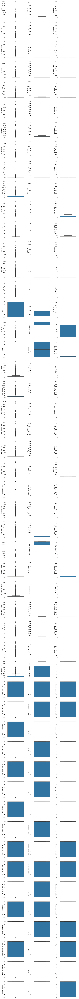

In [58]:
# Plot Box
plot_box(high_value_customers, high_value_customers.columns, 50, 3)

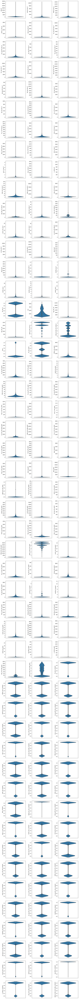

In [59]:
# Plot Violin
plot_violin(high_value_customers, high_value_customers.columns, 50, 3)

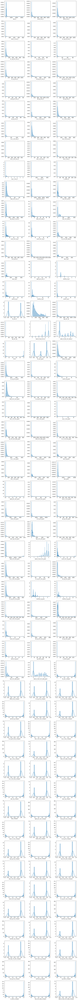

In [60]:
# Plot Dist
plot_dist(high_value_customers, high_value_customers.columns, 50, 3)

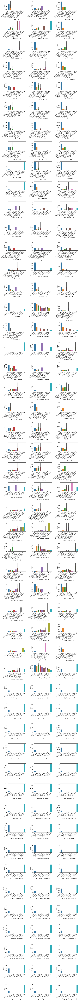

In [61]:
# Plot Bins
plot_bins(high_value_customers, high_value_customers.columns, 50, 3, 10)

### Observations:
__There are outliers for almost all the features__
- Since almost all the columns have outliers, first treat using common quantile of 0.9995
- After that, for each column verify the quantiles and remove outliers accordingly 

In [59]:
# List of cols which should be treated for outliers
cols_to_treat_for_outliers = high_value_customers.columns.values

# Convert to list
cols_to_treat_for_outliers = cols_to_treat_for_outliers.tolist()

# Remove the list of columns that don't need outlier treatment - because of their "ordinal categorical" nature
cols_to_treat_for_outliers.remove('night_pck_user_8')
cols_to_treat_for_outliers.remove('night_pck_user_good')
cols_to_treat_for_outliers.remove('fb_user_8')
cols_to_treat_for_outliers.remove('fb_user_good')
cols_to_treat_for_outliers.remove('week_of_last_rech_8')
cols_to_treat_for_outliers.remove('week_of_last_rech_good')
cols_to_treat_for_outliers.remove('week_of_last_rech_data_8')
cols_to_treat_for_outliers.remove('week_of_last_rech_data_good')
cols_to_treat_for_outliers.remove('churn')

# Remove all 'compare' cols from treating for outliers
cols_to_treat_for_outliers = list(set(cols_to_treat_for_outliers).difference(set(list(filter(lambda k: 'compare' in k, high_value_customers.columns)))))

cols_to_treat_for_outliers = np.array(cols_to_treat_for_outliers)

### Treat outliers commonly for all columns using 99.95% quantile

In [60]:
# Treat outliers - commonly for 99.5 quantile
high_value_customers = outlier_treatment_with_quantile(high_value_customers, cols_to_treat_for_outliers, 0.9995)

In [61]:
high_value_customers.shape

(28543, 150)

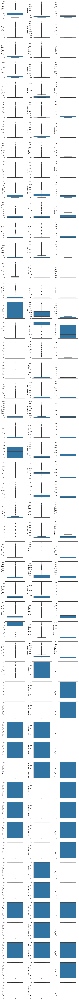

In [62]:
# Plot Box
plot_box(high_value_customers, high_value_customers.columns, 50, 3)

### Observations:
- There are lot of columns without proper spread of data. Hence, we should treat for outliers

### Treat outliers individually for identified columns using 99.5% quantile

In [63]:
cols_without_spread = ['roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2c_mou_8', 'std_og_t2f_mou_8', 'isd_og_mou_8',
                       'std_ic_t2t_mou_8', 'std_ic_t2f_mou_8', 'spl_ic_mou_8', 'isd_ic_mou_8', 'ic_others_8',
                       'sep_vbc_3g', 'std_ic_t2f_mou_good', 'std_og_t2f_mou_good', 'roam_ic_mou_good', 
                       'spl_ic_mou_good', 'isd_ic_mou_good', 'og_others_good', 'sachet_3g_good',
                       'ic_others_good', 'isd_og_mou_good'
                      ]

# Check for values distribution
high_value_customers[cols_without_spread].describe(percentiles=[.25,.5,.75,.90,.95,.99,.9995])

,roam_ic_mou_8,roam_og_mou_8,loc_og_t2c_mou_8,std_og_t2f_mou_8,isd_og_mou_8,std_ic_t2t_mou_8,std_ic_t2f_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,sep_vbc_3g,std_ic_t2f_mou_good,std_og_t2f_mou_good,roam_ic_mou_good,spl_ic_mou_good,isd_ic_mou_good,og_others_good,sachet_3g_good,ic_others_good,isd_og_mou_good
count,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000,28543.000000
mean,10.622467,17.445744,1.541831,1.307624,0.899786,11.608521,2.106980,0.025877,9.008984,0.903864,6.943597,2.307381,1.515399,12.958513,0.038826,9.365358,0.311475,0.184651,1.014457,1.105579
std,51.005396,80.520175,5.208121,7.402516,10.177094,41.538291,10.323196,0.101949,48.721321,5.198411,40.211639,10.131797,7.930457,52.160475,0.089352,47.061454,0.937143,0.655904,5.802747,9.913728
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,6.830000,0.030000,0.000000,0.000000,0.000000,0.000000,0.655000,0.000000,1.480000,0.000000,0.440000,0.000000,0.000000,0.220000,0.000000
90%,14.130000,27.226000,4.426000,1.200000,0.000000,26.804000,3.630000,0.000000,12.530000,1.108000,0.488000,4.605000,2.215000,26.813000,0.150000,15.097000,1.020000,0.500000,1.665000,0.075000
95%,52.635000,94.739000,9.090000,5.548000,0.250000,52.926000,9.980000,0.250000,38.610000,3.510000,28.878000,10.744000,6.503000,69.412000,0.245000,41.229500,1.930000,1.000000,4.280000,1.090000
99%,256.058600,377.806400,26.651600,31.777400,17.617000,180.815000,41.829600,0.530000,192.527400,19.284800,183.366000,41.962400,33.657900,252.148300,0.400000,193.482600,4.406600,3.000000,17.726400,28.789700


In [64]:
high_value_customers = outlier_treatment_with_quantile(high_value_customers, cols_without_spread, 0.995)
high_value_customers.shape

(25773, 150)

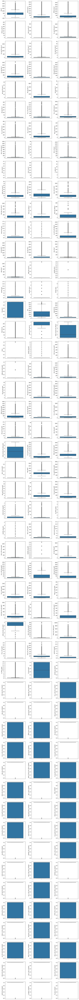

In [65]:
# Plot Box
plot_box(high_value_customers, high_value_customers.columns, 50, 3)

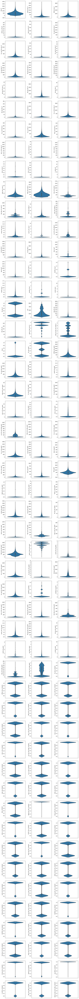

In [69]:
# Plot Violin
plot_violin(high_value_customers, high_value_customers.columns, 50, 3)

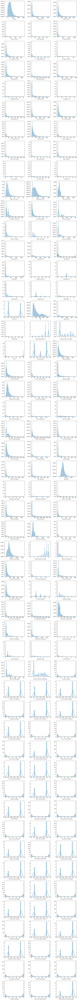

In [70]:
# Plot Dist
plot_dist(high_value_customers, high_value_customers.columns, 50, 3)

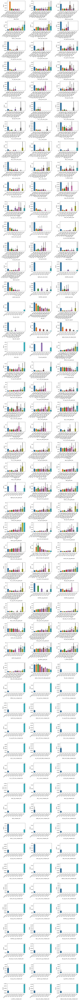

In [71]:
# Plot Bins
plot_bins(high_value_customers, high_value_customers.columns, 50, 3, 10)

### Observations:
- Though there are still outliers, treating further will remove necessary information from data.
- Hence, not treating outliers further

# Model Building

## Feature Normalization

In [66]:
df = high_value_customers.drop('churn', axis=1)
normalized_df = (df-df.mean())/df.std()
normalized_df.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,...,std_ic_t2f_mou_compare,av_rech_amt_data_compare,week_of_last_rech_compare,std_ic_t2t_mou_compare,total_rech_data_compare,isd_ic_mou_compare,max_rech_amt_compare,sachet_2g_compare,ic_others_compare,fb_user_compare
0,-0.725391,-0.561441,-0.761242,-0.234469,-0.257914,-0.431871,-0.685720,-0.343230,-0.333509,-0.722138,...,0.431207,0.587062,0.736381,0.601228,0.209534,0.385388,0.916430,0.451228,0.434808,0.335600
8,-0.952284,-0.471374,-0.425134,-0.234469,-0.257914,-0.356990,-0.448226,-0.343230,1.496881,-0.518167,...,0.431207,0.587062,-1.357941,0.601228,0.209534,0.385388,0.916430,-2.216088,0.434808,-2.979623
21,0.533001,-0.342846,1.660547,-0.234469,-0.257914,-0.291940,-0.193204,-0.239326,-0.333509,-0.302354,...,0.431207,0.587062,0.736381,0.601228,0.209534,0.385388,0.916430,0.451228,0.434808,0.335600
23,-0.270772,-0.475225,-0.254198,-0.234469,-0.257914,-0.230548,0.012383,-0.343230,4.200225,-0.132809,...,0.431207,-1.703332,-1.357941,-1.663197,0.209534,0.385388,-1.091148,0.451228,-2.299774,-2.979623
38,-0.190799,1.149477,-0.520366,-0.234469,-0.257914,-0.375036,-0.596624,-0.343230,-0.333509,-0.630118,...,0.431207,0.587062,0.736381,0.601228,0.209534,0.385388,-1.091148,0.451228,0.434808,0.335600


In [67]:
# Putting feature variables to X
X = normalized_df

# Putting response variable to y
y = high_value_customers['churn']

## Train and Test split

In [68]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [69]:
X_train.shape

(18041, 149)

In [70]:
y_train.shape

(18041,)

In [71]:
y_train.value_counts()

0    16569
1     1472
Name: churn, dtype: int64

### Handling Class Imbalance with SMOTE
- There are very few churns when compared to non-churns
- Handling class imbalance is very important for the model to predict accurately

In [72]:
# Store Columns
X_cols = X_train.columns.values

smt = SMOTE()
X_train, y_train = smt.fit_sample(X_train, y_train)
X_train = pd.DataFrame(data=X_train, columns=X_cols)
y_train = pd.DataFrame(data=y_train, columns=['churn'])

In [73]:
# % of churns vs non-churned
percent_churned = (len(y_train.loc[y_train['churn'] == 1])/len(y_train)) * 100
percent_not_churned = 100 - percent_churned
print(percent_churned)
print(percent_not_churned)

50.0
50.0


### Observation:
- After handling class imbalance, y_train now contains 50% of churns and 50% of non-churns

## Principal Component Analysis (PCA)
- Expect to get similar model performance with significantly lower features
- If we can do so, we would have done effective dimensionality reduction without losing any import information

In [74]:
pca = PCA(svd_solver='randomized', random_state=42)

In [75]:
#Doing the PCA on the train data
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

#### Let's plot the principal components and try to make sense of them
- We'll plot original features on the first 2 principal components as axes

In [76]:
pca.components_

array([[ 1.71184531e-01,  4.23875680e-02,  7.80223354e-02, ...,
        -6.90913416e-02, -4.58125531e-02, -6.78979654e-02],
       [ 1.76290254e-01,  1.56058501e-01,  1.69876448e-01, ...,
        -1.73363762e-02, -3.15906140e-02, -9.09898138e-03],
       [ 5.13501085e-02, -1.74407404e-02,  2.02544587e-02, ...,
         1.36203655e-01,  8.90222158e-03,  4.15269842e-02],
       ...,
       [-0.00000000e+00, -3.37410645e-15, -1.97528410e-15, ...,
         5.55111512e-17,  1.92554306e-16, -1.31838984e-16],
       [ 0.00000000e+00, -2.55629514e-15, -2.60530967e-15, ...,
        -2.96637714e-16,  1.73906028e-16,  8.50014503e-17],
       [-0.00000000e+00,  2.69116831e-15,  1.34817032e-15, ...,
        -1.04517089e-16,  9.84455573e-17, -3.77302356e-17]])

In [77]:
colnames = list(X_train.columns)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
pcs_df.head()

,PC1,PC2,Feature
0,0.171185,0.176290,arpu_8
1,0.042388,0.156059,onnet_mou_8
2,0.078022,0.169876,offnet_mou_8
3,-0.014552,0.039943,roam_ic_mou_8
4,-0.025015,0.063641,roam_og_mou_8


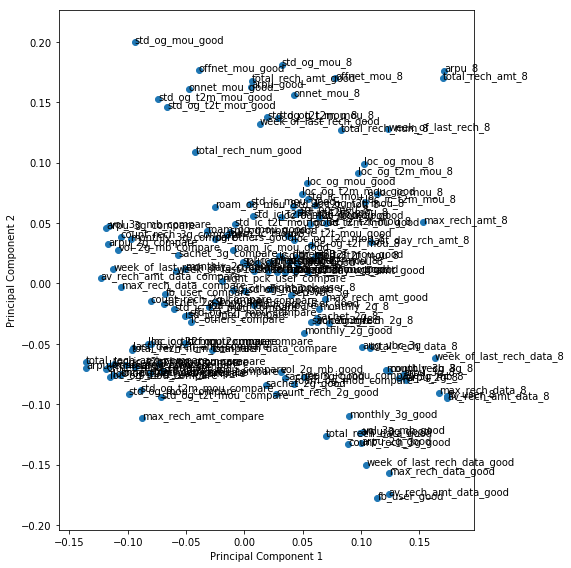

In [78]:
%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

### Looking at the screeplot to assess the number of needed principal components

In [79]:
pca.explained_variance_ratio_

array([1.21599245e-01, 9.50396620e-02, 5.33207898e-02, 4.48674963e-02,
       3.41440878e-02, 3.01150780e-02, 2.67491445e-02, 2.55686550e-02,
       2.19258128e-02, 1.99282107e-02, 1.84176882e-02, 1.62578961e-02,
       1.52810128e-02, 1.51679554e-02, 1.37371178e-02, 1.26518831e-02,
       1.23973628e-02, 1.17908081e-02, 1.13008191e-02, 1.10506812e-02,
       1.08244846e-02, 1.03980374e-02, 1.03092224e-02, 9.93825714e-03,
       9.53026728e-03, 9.40850986e-03, 9.04266179e-03, 8.22792950e-03,
       8.17355933e-03, 7.98965160e-03, 7.86934558e-03, 7.66682715e-03,
       7.48364031e-03, 7.47150139e-03, 7.08878595e-03, 6.89049445e-03,
       6.65393474e-03, 6.52603602e-03, 6.31683940e-03, 6.29365462e-03,
       5.99825531e-03, 5.94595218e-03, 5.81155926e-03, 5.75549159e-03,
       5.67867696e-03, 5.52934242e-03, 5.43258506e-03, 5.26731862e-03,
       5.25244468e-03, 5.09556168e-03, 5.01123578e-03, 4.88726066e-03,
       4.80204512e-03, 4.75241953e-03, 4.67261264e-03, 4.57101701e-03,
      

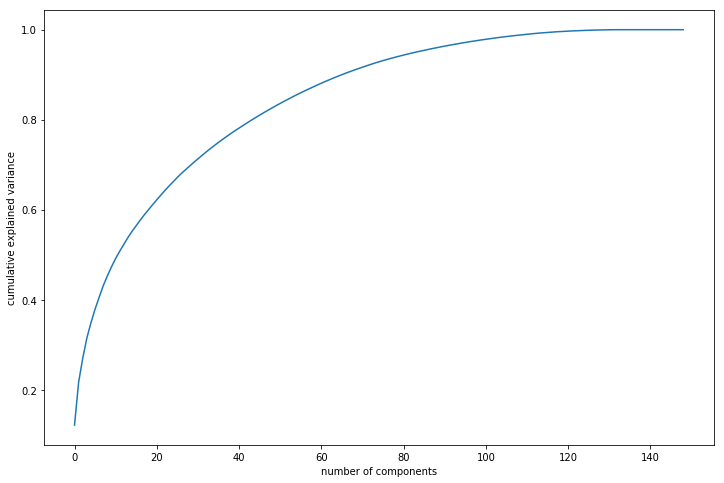

In [80]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

__Use a range of PCAs to identify an optimal no. of PCAs required__

In [81]:
#Using incremental PCA for efficiency - saves a lot of time on larger datasets
pca_60 = IncrementalPCA(n_components=60)
pca_30 = IncrementalPCA(n_components=30)
pca_20 = IncrementalPCA(n_components=20)

In [82]:
# Getting data into PCAs - with 60 PCAs
df_train_pca = pca_60.fit_transform(X_train)

#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)

#Applying selected components to the test data - 60 components
df_test_pca = pca_60.transform(X_test)
df_test_pca.shape

#Training the model on the train data
learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca,y_train)

#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
predictions = model_pca.predict(df_test_pca)
print("{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test)))

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = predictions)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=predictions)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=predictions)

# AUC score
auc_score = metrics.roc_auc_score(y_test, predictions)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

max corr: 0.008385493594264389 , min corr:  -0.01049949497676145
0.92
Test accuracy:  0.8671753750646664 

Confusion matrix:  [[6159  939]
 [  88  546]]
Recall score:  0.861198738170347
AUC score:  0.8644539760167035


In [83]:
# Getting data into PCAs - with 30 PCAs
df_train_pca = pca_30.fit_transform(X_train)

#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)

#Applying selected components to the test data - 60 components
df_test_pca = pca_30.transform(X_test)
df_test_pca.shape

#Training the model on the train data
learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca,y_train)

#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
predictions = model_pca.predict(df_test_pca)
print("{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test)))

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = predictions)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=predictions)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=predictions)

# AUC score
auc_score = metrics.roc_auc_score(y_test, predictions)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

max corr: 0.0163107195331702 , min corr:  -0.01111885892645126
0.92
Test accuracy:  0.8612260734609415 

Confusion matrix:  [[6114  984]
 [  89  545]]
Recall score:  0.8596214511041009
AUC score:  0.8604954254675196


In [84]:
# Getting data into PCAs - with 20 PCAs
df_train_pca = pca_20.fit_transform(X_train)

#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)

#Applying selected components to the test data - 60 components
df_test_pca = pca_20.transform(X_test)
df_test_pca.shape

#Training the model on the train data
learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca,y_train)

#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
predictions = model_pca.predict(df_test_pca)
print("{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test)))

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = predictions)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=predictions)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=predictions)

# AUC score
auc_score = metrics.roc_auc_score(y_test, predictions)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

max corr: 0.030490772497848546 , min corr:  -0.01034714870091554
0.91
Test accuracy:  0.8458354888773927 

Confusion matrix:  [[5999 1099]
 [  93  541]]
Recall score:  0.8533123028391167
AUC score:  0.8492399778495386


### Observations:
- With 60 PCAs, AUC score is .92
- With 30 PCAs, AUC score is .92
- With 20 PCAs, AUC score is .91
- Though having more PCAs certainly have better performance, model complexity also increases.
- __It is always good to have a trade-off between model complexity and its performance__
- __Hence, continuing with 20 PCAs - as we have a better AUC, recall scores and enough no. of features__

In [85]:
# Continuing with 20 PCAs
pca_final = IncrementalPCA(n_components=20)

### Basis transformation - getting the data onto our PCAs

In [86]:
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(33138, 20)

### Creating correlation matrix for the principal components - we expect little to no correlation

In [87]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(df_train_pca.transpose())

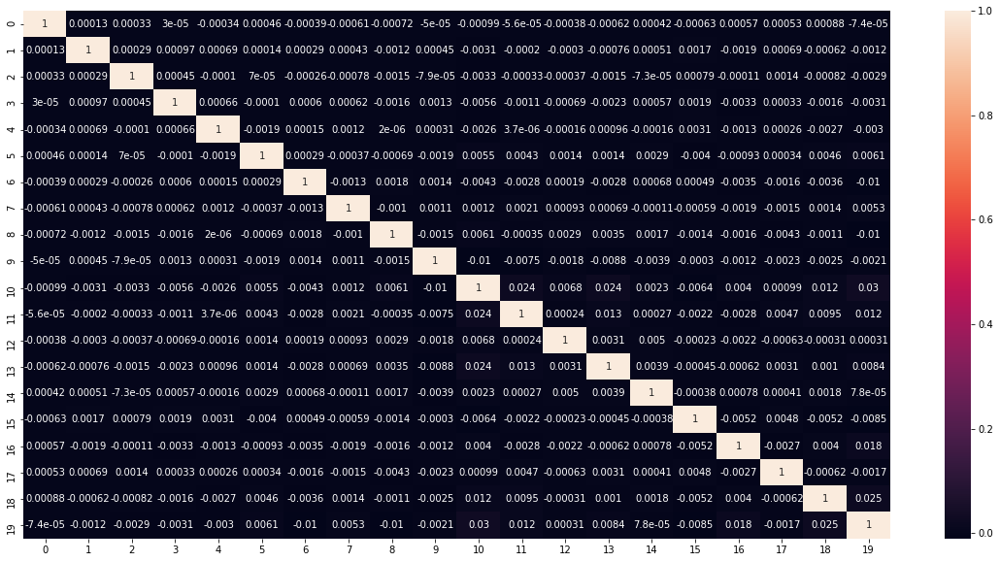

In [88]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)

In [89]:
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.030490772497848546 , min corr:  -0.01034714870091554


__Clearly, there is no correlation between any 2 features__

In [90]:
#Applying selected components to the test data - 60 components
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(7732, 20)

### PCA using LogisticRegression Model

In [91]:
#Training the model on the train data
learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca,y_train)

In [92]:
#Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
predictions = model_pca.predict(df_test_pca)
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.91'

In [93]:
# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = predictions)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=predictions)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=predictions)

# AUC score
auc_score = metrics.roc_auc_score(y_test, predictions)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

Test accuracy:  0.8458354888773927 

Confusion matrix:  [[5999 1099]
 [  93  541]]
Recall score:  0.8533123028391167
AUC score:  0.8492399778495386


### PCA using Non-Linear SVM Model

In [94]:
# rbf kernel with other hyperparameters kept to default 
svm_rbf = svm.SVC(kernel='rbf')
svm_rbf.fit(df_train_pca, y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [95]:
# predict
predictions = svm_rbf.predict(df_test_pca)

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true=y_test, y_pred=predictions)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=predictions)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=predictions)

# AUC score
auc_score = metrics.roc_auc_score(y_test, predictions)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

Test accuracy:  0.9059751681324366 

Confusion matrix:  [[6555  543]
 [ 184  450]]
Recall score:  0.7097791798107256
AUC score:  0.8166393785782283


#### Hyperparameter Tuning - using GridSearchCV with 'roc_auc' scoring

In [96]:
# conduct (grid search) cross-validation to find the optimal values 
# of cost C and the choice of kernel

parameters = {'C':[1, 10, 100], 
             'gamma': [1e-2, 1e-3, 1e-4]}

# instantiate a model 
svc_grid_search = svm.SVC(kernel="rbf")

# create a classifier to perform grid search
clf = GridSearchCV(svc_grid_search, param_grid=parameters, scoring='roc_auc')

# fit
clf.fit(df_train_pca, y_train)

GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [1, 10, 100], 'gamma': [0.01, 0.001, 0.0001]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

In [97]:
# results
cv_results = pd.DataFrame(clf.cv_results_)

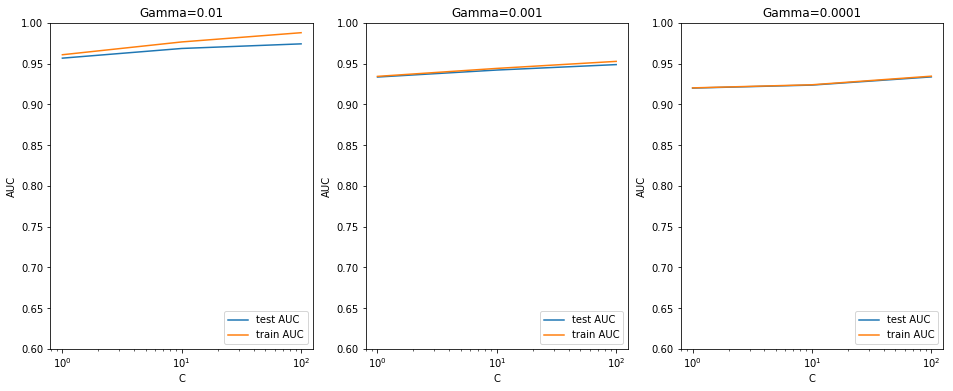

In [98]:
# converting C to numeric type for plotting on x-axis
cv_results['param_C'] = cv_results['param_C'].astype('int')

# # plotting
plt.figure(figsize=(16,6))

# subplot 1/3
plt.subplot(131)
gamma_01 = cv_results[cv_results['param_gamma']==0.01]

plt.plot(gamma_01["param_C"], gamma_01["mean_test_score"])
plt.plot(gamma_01["param_C"], gamma_01["mean_train_score"])
plt.xlabel('C')
plt.ylabel('AUC')
plt.title("Gamma=0.01")
plt.ylim([0.60, 1])
plt.legend(['test AUC', 'train AUC'], loc='lower right')
plt.xscale('log')

# subplot 2/3
plt.subplot(132)
gamma_001 = cv_results[cv_results['param_gamma']==0.001]

plt.plot(gamma_001["param_C"], gamma_001["mean_test_score"])
plt.plot(gamma_001["param_C"], gamma_001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('AUC')
plt.title("Gamma=0.001")
plt.ylim([0.60, 1])
plt.legend(['test AUC', 'train AUC'], loc='lower right')
plt.xscale('log')


# subplot 3/3
plt.subplot(133)
gamma_0001 = cv_results[cv_results['param_gamma']==0.0001]

plt.plot(gamma_0001["param_C"], gamma_0001["mean_test_score"])
plt.plot(gamma_0001["param_C"], gamma_0001["mean_train_score"])
plt.xlabel('C')
plt.ylabel('AUC')
plt.title("Gamma=0.0001")
plt.ylim([0.60, 1])
plt.legend(['test AUC', 'train AUC'], loc='lower right')
plt.xscale('log')

plt.show()

__Final Model__

In [99]:
# Select best gamma
# optimal hyperparameters
best_C = 10
best_gamma = 0.01

# model
svm_final = svm.SVC(kernel='rbf', C=best_C, gamma=best_gamma)

# fit
svm_final.fit(df_train_pca, y_train)

SVC(C=10, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.01, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [100]:
# predict
predictions = svm_final.predict(df_test_pca)

In [101]:
# evaluation: CM 
confusion = metrics.confusion_matrix(y_true=y_test, y_pred=predictions)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=predictions)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=predictions)

# Precision score
precision_score = metrics.precision_score(y_true=y_test, y_pred=predictions)

# AUC score
auc_score = metrics.roc_auc_score(y_test, predictions)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

Test accuracy:  0.8971805483704087 

Confusion matrix:  [[6443  655]
 [ 140  494]]
Recall score:  0.7791798107255521
AUC score:  0.8434501476845568


### PCA using Linear SVM Model

In [128]:
# rbf kernel with other hyperparameters kept to default 
svm_rbf = svm.SVC(kernel='linear')
svm_rbf.fit(df_train_pca, y_train)

# predict
predictions = svm_rbf.predict(df_test_pca)

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true=y_test, y_pred=predictions)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=predictions)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=predictions)

# AUC score
auc_score = metrics.roc_auc_score(y_test, predictions)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

Test accuracy:  0.8495598135680994 

Confusion matrix:  [[6033 1057]
 [ 105  529]]
Recall score:  0.8343848580441641
AUC score:  0.8426508211236334


#### Hyperparameter Tuning - using GridSearchCV with 'roc_auc' scoring for Linear SVM requires high computational power and hence, not performing it

### PCA using Random Forest Model

#### Hyperparameter Tuning - using GridSearchCV with 'roc_auc' scoring
- Instead of running an iteration for each parameter, perform tuning on all parameters at once

In [253]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1, 
                           scoring="roc_auc")

In [254]:
# Fit the grid search to the data
grid_search.fit(df_train_pca, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 22.1min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [4, 8, 10], 'min_samples_leaf': range(100, 400, 200), 'min_samples_split': range(200, 500, 200), 'n_estimators': [100, 200, 300], 'max_features': [5, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=1)

In [255]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9446549141259417 using {'max_depth': 10, 'max_features': 10, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 300}


__Final Model__

In [256]:
# model with the best hyperparameters
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             max_features=10,
                             min_samples_leaf=100, 
                             min_samples_split=200,
                             n_estimators=300)

In [257]:
# fit
rfc.fit(df_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=10, max_features=10, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=200,
            min_weight_fraction_leaf=0.0, n_estimators=300, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [258]:
# predict
predictions = rfc.predict(df_test_pca)

In [259]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      0.89      0.94      7155
           1       0.37      0.79      0.50       563

   micro avg       0.89      0.89      0.89      7718
   macro avg       0.67      0.84      0.72      7718
weighted avg       0.94      0.89      0.90      7718



In [260]:
# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = predictions)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=predictions)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=predictions)

# AUC score
auc_score = metrics.roc_auc_score(y_test, predictions)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

Test accuracy:  0.88572168955688 

Confusion matrix:  [[6391  764]
 [ 118  445]]
Recall score:  0.7904085257548845
AUC score:  0.8418150245825436


# PCA observations:

- Logistic Regression results:
    - Test Accuracy: 0.83
    - Recall Score: 0.83
    - AUC Score: 0.83
- Non Linear SVM results:
    - Test Accuracy: 0.89
    - Recall Score: 0.76
    - AUC Score: 0.83
- Linear SVM results:
    - Test Accuracy: 0.84
    - Recall Score: 0.83
    - AUC Score: 0.84
- Random Forest results:
    - Test Accuracy:0.88
    - Recall Score: 0.79
    - AUC Score: 0.84

# PCA recommendations:

- __Linear models are performing better than non-linear model__
- Hence, we can chose one of the above linear models for predicting customer churn
- Since __Logistic Regression__ is less complex and scores are similar to Linear SVM and Random Forests, it is better to choose Logistic Regression

# Churn Indicators
- From above PCA models, we can conclude that linear models are performing better
- Hence, choosing __Decision Trees__ to identify the customer churn indicators

# Decision Trees

#### Hyperparameter Tuning - using GridSearchCV with 'roc_auc' scoring
- Instead of running an iteration for each parameter, perform tuning on all parameters at once

In [108]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, scoring='roc_auc')

# Fit the grid search to the data
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  2.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': range(5, 15, 5), 'min_samples_leaf': range(50, 150, 50), 'min_samples_split': range(50, 150, 50), 'criterion': ['entropy', 'gini']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=1)

In [109]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)

In [110]:
# printing the optimal roc_auc score and hyperparameters
print("best roc_auc", grid_search.best_score_)
print(grid_search.best_estimator_)

best roc_auc 0.9711392984384433
DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')


**Running the model with best parameters obtained from grid search.**

#### Model with optimal hyperparametes with 'entropy' criterion

Accuracy Score:  0.8946141895390989
              precision    recall  f1-score   support

           0       0.98      0.91      0.94      7090
           1       0.42      0.76      0.54       634

   micro avg       0.89      0.89      0.89      7724
   macro avg       0.70      0.83      0.74      7724
weighted avg       0.93      0.89      0.91      7724

Test accuracy:  0.8946141895390989 

Confusion matrix:  [[6426  664]
 [ 150  484]]
Recall score:  0.7634069400630915
AUC score:  0.8348769538115176


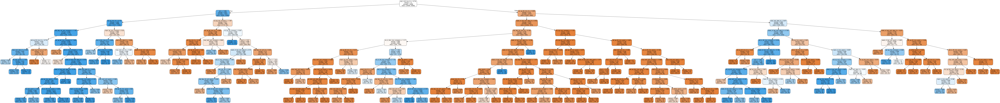

In [124]:
# model with optimal hyperparameters
clf_entropy = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_entropy.fit(X_train, y_train)

# accuracy score
print('Accuracy Score: ', clf_entropy.score(X_test,y_test))

# Predict
y_pred = clf_entropy.predict(X_test)
print(classification_report(y_test, y_pred))

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = y_pred)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=y_pred)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=y_pred)

# AUC score
auc_score = metrics.roc_auc_score(y_test, y_pred)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

# Putting features
features = list(high_value_customers.columns[1:])

# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### Model with optimal hyperparametes with 'gini' criterion

Accuracy Score:  0.9018643190056965
              precision    recall  f1-score   support

           0       0.98      0.91      0.94      7090
           1       0.44      0.78      0.57       634

   micro avg       0.90      0.90      0.90      7724
   macro avg       0.71      0.85      0.76      7724
weighted avg       0.93      0.90      0.91      7724

Test accuracy:  0.9018643190056965 

Confusion matrix:  [[6473  617]
 [ 141  493]]
Recall score:  0.777602523659306
AUC score:  0.8452892731131508


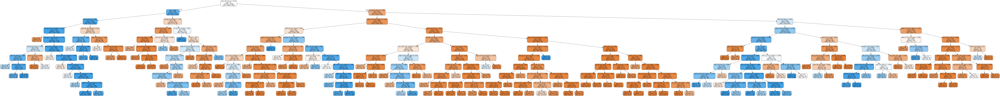

In [125]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

# accuracy score
print('Accuracy Score: ', clf_gini.score(X_test,y_test))

# Predict
y_pred = clf_gini.predict(X_test)
print(classification_report(y_test, y_pred))

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = y_pred)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=y_pred)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=y_pred)

# AUC score
auc_score = metrics.roc_auc_score(y_test, y_pred)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

# Putting features
features = list(high_value_customers.columns[1:])

# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### Reducing tree depth to 4 for a less complex model

0.9105385810460901
              precision    recall  f1-score   support

           0       0.97      0.93      0.95      7090
           1       0.47      0.72      0.57       634

   micro avg       0.91      0.91      0.91      7724
   macro avg       0.72      0.83      0.76      7724
weighted avg       0.93      0.91      0.92      7724

Test accuracy:  0.9105385810460901 

Confusion matrix:  [[6574  516]
 [ 175  459]]
Recall score:  0.7239747634069401
AUC score:  0.8255981010264603


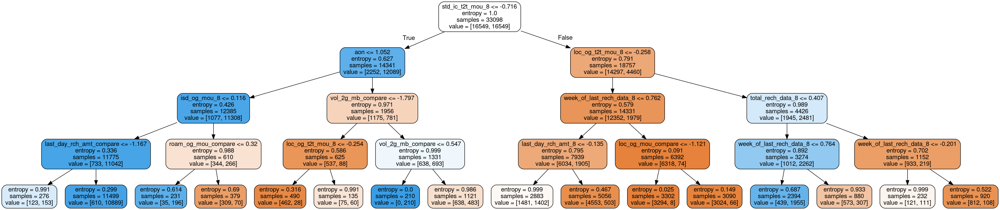

In [126]:
# tree with max_depth = 4 and 'entropy' criterion
clf_entropy = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=4, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_entropy.fit(X_train, y_train)

# score
print(clf_entropy.score(X_test,y_test))


y_pred = clf_entropy.predict(X_test)
print(classification_report(y_test, y_pred))

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = y_pred)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=y_pred)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=y_pred)

# AUC score
auc_score = metrics.roc_auc_score(y_test, y_pred)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

# plotting tree with max_depth=4
dot_data = StringIO()  
export_graphviz(clf_entropy, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

0.8962972553081305
              precision    recall  f1-score   support

           0       0.97      0.93      0.95      7090
           1       0.47      0.72      0.57       634

   micro avg       0.91      0.91      0.91      7724
   macro avg       0.72      0.83      0.76      7724
weighted avg       0.93      0.91      0.92      7724

Test accuracy:  0.9105385810460901 

Confusion matrix:  [[6574  516]
 [ 175  459]]
Recall score:  0.7239747634069401
AUC score:  0.8255981010264603


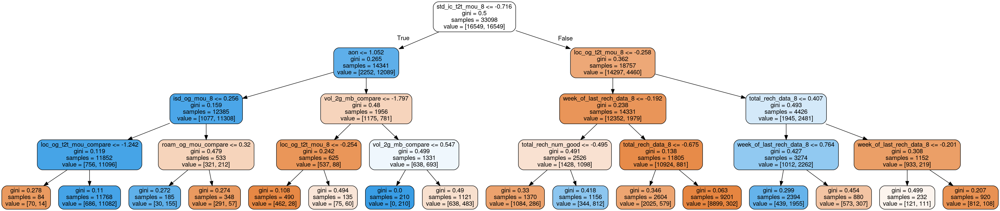

In [127]:
# tree with max_depth = 4 and 'gini' criterion
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=4, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
clf_gini.fit(X_train, y_train)

# score
print(clf_gini.score(X_test,y_test))


y_pred = clf_entropy.predict(X_test)
print(classification_report(y_test, y_pred))

# evaluation: CM 
confusion = metrics.confusion_matrix(y_true = y_test, y_pred = y_pred)

# measure accuracy
test_accuracy = metrics.accuracy_score(y_true=y_test, y_pred=y_pred)

# Recall score
recall_score = metrics.recall_score(y_true=y_test, y_pred=y_pred)

# AUC score
auc_score = metrics.roc_auc_score(y_test, y_pred)

print('Test accuracy: ', test_accuracy, "\n")
print('Confusion matrix: ', confusion)
print('Recall score: ', recall_score)
print('AUC score: ', auc_score)

# plotting tree with max_depth=4
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# Conclusions:
- Though the test accuracy and AUC scores are comparible with predictor models, recall score is not in par
- __Strong indicators of churn in "action" phase are either of the 2 combinations__:
    - __First Combination__
        - Decrease in minutes of usage of STD incoming calls from same operator
        - Increase in Age on Network - i.e. the more the amount of time a customer is associated with a network, the more likely that he/she may churn
        - Decrease in usage of 2G data in action phase when compared to good phase
    - __Second Combination__
        - Increase in minutes of usage of STD incoming calls from same operator
        - Decrease in minutes of usage of local outgoing calls from same operator
        - Inconsistent patterns in recharging data with respect to the week - i.e. data is not lasting through the month
        - Increase in the total number of recharges

# Recommendations:
- Taking corrective measure during "action" phase can stop a customer from churning
- Following are the recommended corrective measures based upon the churn indicators identified:
    - Ensuring quality and quick network connectivity to attend STD calls
    - Providing special packages for privileged customers who are using the services for a long time
    - Offering suitable recharge packs for local outgoing calls
    - Offering data recharge packs that costs lower - for high data usage customers
    - Design recharge packs that last for a longer duration - for both minutes and data - for high usage customers